In [1]:
# Get metadata object
import json
meta_data_file_path = "/fb-agios-acai-efs/Ego4D/ego4d_data/ego4d.json"

with open(meta_data_file_path, 'r') as meta_data_file:
    meta_data_obj = json.load(meta_data_file)

In [2]:
import os.path as osp
import json

# Get annotations
annotation_file_names = [n.strip() for n in """
fho_lta_debug_val.json
fho_lta_taxonomy.json
fho_lta_test_unannotated.json
fho_lta_train.json
fho_lta_train_10000.json
fho_lta_train_5000.json
fho_lta_val.json
""".split('\n') if len(n)> 0]
print(annotation_file_names)

annotation_file_dir = "/fb-agios-acai-efs/Ego4D/ego4d_data/v1/annotations"
annotation_file_name = {'train':"fho_lta_train.json",'val':'fho_lta_val.json','test':'fho_lta_test_unannotated.json'}['train']
assert annotation_file_name in annotation_file_names
annotation_file_path = osp.join(annotation_file_dir, annotation_file_name)

with open(annotation_file_path, 'r') as annotation_file:
    annotation_obj = json.load(annotation_file)


['fho_lta_debug_val.json', 'fho_lta_taxonomy.json', 'fho_lta_test_unannotated.json', 'fho_lta_train.json', 'fho_lta_train_10000.json', 'fho_lta_train_5000.json', 'fho_lta_val.json']


In [3]:
# Check out the annotations
# print(annotation_obj.keys())
print(annotation_obj)

"""
The clips indicate a unique action in a timeframe of a specific video.
There are multiple clips 'clip_uid' (and hence actions) per 'video_uid'.
e.g. search on video_uid '9c59e912-2340-4400-b2df-7db3d4066723', resulting in 74 unique clip_uids

Action-Label: is indicated by 'action_idx'.
"""

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



"\nThe clips indicate a unique action in a timeframe of a specific video.\nThere are multiple clips 'clip_uid' (and hence actions) per 'video_uid'.\ne.g. search on video_uid '9c59e912-2340-4400-b2df-7db3d4066723', resulting in 74 unique clip_uids\n\nAction-Label: is indicated by 'action_idx'.\n"

In [4]:
# Link to user in meta-data
meta_data_obj

{'date': '220407',
 'version': '1',
 'description': 'Ego4d Video Metadata',
 'videos': [{'video_uid': '77cc4654-4eec-44c6-af05-dbdf71f9a401',
   'duration_sec': 1247.13,
   'scenarios': ['Car - commuting, road trip', 'Talking with family members'],
   'video_metadata': {'fps': 30.0,
    'num_frames': 37414,
    'video_codec': 'libvpx-vp9',
    'audio_codec': 'aac',
    'display_resolution_width': 1920,
    'display_resolution_height': 1080,
    'sample_resolution_width': 1920,
    'sample_resolution_height': 1080,
    'mp4_duration_sec': 1247.13,
    'video_start_sec': 0.0,
    'video_duration_sec': 1247.13,
    'audio_start_sec': None,
    'audio_duration_sec': None,
    'video_start_pts': 0,
    'video_duration_pts': 19155968,
    'video_base_numerator': 1,
    'video_base_denominator': 15360,
    'audio_start_pts': None,
    'audio_duration_pts': None,
    'audio_base_numerator': None,
    'audio_base_denominator': None},
   'split_em': None,
   'split_av': None,
   'split_fho': Non

In [5]:
# If we want a video-agnostic histogram per user, we will need to merge the annotations with the video meta-data.
# Per-user, we need all the video_uids, and for all these videos we need to collect all 'clip_uids'.
# Per clip there is an associated action, which we want to count for the histogram.


# See pandas merging API: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html
import pandas as pd
import numpy as np
from collections import Counter
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)                 

pd.json_normalize(meta_data_obj) # L1 overview
video_df = pd.json_normalize(meta_data_obj['videos'])

video_df.head(n=50)

# Null/unassigned users are omitted automatically
scenarios_per_user_df = video_df.groupby(video_df['fb_participant_id'], as_index=False).agg({'scenarios':list,'video_uid':'count','duration_sec':'sum'})
scenarios_per_user_df['scenarios'] = scenarios_per_user_df['scenarios'].apply(np.concatenate).apply(Counter) # FLATTEN
scenarios_per_user_df = scenarios_per_user_df.rename(columns={"video_uid":"video_count"})
scenarios_per_user_df

,fb_participant_id,scenarios,video_count,duration_sec
0,8.0,{'Crafting/knitting/sewing/drawing/painting': 8},8,22002.95
1,9.0,"{'Playing cards': 1, 'Gardening': 2}",3,3875.60
2,10.0,"{'Household management - caring for kids': 4, ...",10,8202.33
3,11.0,"{'Household management - caring for kids': 37,...",38,27094.81
4,12.0,{'Crafting/knitting/sewing/drawing/painting': 23},23,39797.95
...,...,...,...,...
808,872.0,{'Climbing': 2},2,11913.56
809,873.0,{'Climbing': 2},2,4961.87
810,874.0,{'Climbing': 1},1,2930.60
811,875.0,"{'On a screen (phone/laptop)': 1, 'Tourism': 1...",1,3093.23


In [6]:
import pandas as pd
import numpy as np
from collections import Counter
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)                 

pd.json_normalize(annotation_obj) # L1 overview
labeled_clips_df = pd.json_normalize(annotation_obj['clips'])

# labeled_clips_df.loc[labeled_clips_df['clip_id'] == 1805] # SELECT WHERE...
# labeled_clips_df.loc[labeled_clips_df['video_uid'] == '8b72b54f-f87c-4fdb-84dc-97e42ab111ac'] # SELECT WHERE...

labeled_clips_df

,video_uid,clip_uid,clip_parent_start_sec,clip_parent_end_sec,clip_parent_start_frame,clip_parent_end_frame,interval_start_frame,interval_end_frame,interval_start_sec,interval_end_sec,verb,noun,action_clip_start_sec,action_clip_end_sec,action_clip_start_frame,action_clip_end_frame,clip_id,action_idx,verb_label,noun_label
0,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.000000,0,9239,0,8999,0.0,300.00,"put_(place,_leave,_drop)","mower_(lawnmower,_mower)",2.487695,10.487695,74,314,1805,0,65,259
1,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.000000,0,9239,0,8999,0.0,300.00,"adjust_(regulate,_increase/reduce,_change)","mower_(lawnmower,_mower)",6.521029,14.521029,195,435,1805,1,0,259
2,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.000000,0,9239,0,8999,0.0,300.00,"put_(place,_leave,_drop)",glove,15.287695,23.287695,458,698,1805,2,65,182
3,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.000000,0,9239,0,8999,0.0,300.00,"cut_(trim,_slice,_chop)",grass,22.454362,30.454362,673,913,1805,3,16,190
4,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.000000,0,9239,0,8999,0.0,300.00,repair,"mower_(lawnmower,_mower)",43.221029,51.221029,1296,1536,1805,4,68,259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23605,8b72b54f-f87c-4fdb-84dc-97e42ab111ac,982edbf9-2ed2-401d-8b55-d5308dc9e2f6,1492.0,1525.951029,44759,45778,44999,45779,1500.0,1525.98,"hit_(knock,_hit,_hammer)","spoon_(spoon,_spoonful)",15.854362,23.854362,476,716,1117,3,34,390
23606,8b72b54f-f87c-4fdb-84dc-97e42ab111ac,982edbf9-2ed2-401d-8b55-d5308dc9e2f6,1492.0,1525.951029,44759,45778,44999,45779,1500.0,1525.98,cover,food,16.921029,24.921029,508,748,1117,4,14,163
23607,8b72b54f-f87c-4fdb-84dc-97e42ab111ac,982edbf9-2ed2-401d-8b55-d5308dc9e2f6,1492.0,1525.951029,44759,45778,44999,45779,1500.0,1525.98,"put_(place,_leave,_drop)","spoon_(spoon,_spoonful)",20.887695,28.887695,627,867,1117,5,65,390
23608,8b72b54f-f87c-4fdb-84dc-97e42ab111ac,982edbf9-2ed2-401d-8b55-d5308dc9e2f6,1492.0,1525.951029,44759,45778,44999,45779,1500.0,1525.98,"take_(pick,_grab,_get)","phone_(cellphone,_phone,_smartphone)",27.021029,33.921029,811,1018,1117,6,92,300


There is one entry per supervision-label. This may contain multiple clips and multiple video fragments.
A clip can be a sub-video of the parent video (probably because some videos very long for continuous labeling). One clip_id has multiple entries for all actions happening in that clip.

The action label is identified by ('verb','noun') or ('verb_label','noun_label'). Don't use 'action_idx', this indicates the 'action-idx'-th action in a clip (action counter)!

Multiple actions can happen at the same time! (Overlap in clip time ranges)

We don't really need the clip_id, we can use the video_id to link it to the user.

In [17]:
import numpy as np

# First link labels to videos - INNER JOIN of meta-object and labels-object
print(video_df.shape)
print(f"labels_df={labeled_clips_df.shape}")
joined_df = pd.merge(video_df, labeled_clips_df, on="video_uid",validate="one_to_many",how="inner") # Inner-join (Intersection of  video-uid values)
print(f"joined_df={joined_df.shape} -> Good, should have same #rows as labels-df, only keys are extended with info from meta-data object, such as user id etc")
joined_df

def duration_row_fn(x):
    video_uid_list = x[0]
    video_len_list = x[1]

    uniqe_video_uid_list, idxs = np.unique(video_uid_list,return_index=True)
    sum_unique_video_len = sum(np.asarray(video_len_list,dtype=np.float64)[idxs])

    return sum_unique_video_len
    
# Then group by user and aggregate columns
def group_innerjoin_by_user(joined_df):
    user_df = joined_df.copy(deep=True).groupby(joined_df['fb_participant_id'], as_index=False).agg(
        {'fb_participant_id':'first','scenarios':list,'verb':list,'noun':list, 'verb_label':list, 'noun_label':list,
         'video_uid':list,'duration_sec':list,'clip_id':list,'action_idx':list}) # VIDEO UID COUNT IS NOT CORRECT! Also counts non-uniques in join

    user_df['duration_sec_sum'] = user_df.loc[:,('video_uid','duration_sec')].apply(duration_row_fn, axis=1)
    user_df['video_count'] = user_df['video_uid'].apply(lambda x: len(np.unique(x))) # BUGFIX: we need only UNIQUE video_uids after inner_join
    user_df['scenarios'] = user_df['scenarios'].apply(np.concatenate) # FLATTEN
    user_df['action_count'] = user_df['action_idx'].apply(lambda x:len(x))
    user_df.drop('duration_sec', axis=1, inplace=True) # Make sure we don't use this one further on
    return user_df

user_df = group_innerjoin_by_user(joined_df)
user_df

(9645, 54)
labels_df=(23610, 20)
joined_df=(23610, 73) -> Good, should have same #rows as labels-df, only keys are extended with info from meta-data object, such as user id etc


,fb_participant_id,scenarios,verb,noun,verb_label,noun_label,video_uid,clip_id,action_idx,duration_sec_sum,video_count,action_count
0,8.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[paint, put_(place,_leave,_drop), take_(pick,_...","[cardboard_(cardboard,_paperboard), paintbrush...","[53, 65, 92, 19, 53, 53, 53, 65, 53, 19, 53, 5...","[68, 279, 279, 279, 286, 280, 469, 279, 280, 2...","[f6da2935-f18d-4ef4-9a50-8890d1cf796a, f6da293...","[1725, 1725, 1725, 1725, 1725, 1725, 1725, 172...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1319.57,1,18
1,9.0,"[Playing cards, Playing cards, Playing cards, ...","[take_(pick,_grab,_get), take_(pick,_grab,_get...","[card, card, card, card, card, card, card, foo...","[92, 92, 92, 58, 80, 92, 92, 92, 92, 92, 92, 5...","[67, 67, 67, 67, 67, 67, 67, 163, 163, 67, 67,...","[2c84e6a0-2a0b-4de8-ae99-aedbc871dffa, 2c84e6a...","[2863, 2863, 2863, 2863, 2863, 2863, 2863, 286...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3368.20,2,60
2,10.0,"[Household management - caring for kids, House...","[clean_(sweep,_scrub,_mop,_dust), clean_(sweep...","[rail_(rail,_railing), wood_(fiber,_firewood,_...","[9, 9, 9, 9, 9, 9, 9, 9, 49, 9, 9, 9, 9, 9, 9,...","[328, 469, 469, 469, 328, 469, 328, 469, 80, 4...","[0be30efe-9d71-4698-8304-f1d441aeea58, 0be30ef...","[2618, 2618, 2618, 2618, 2618, 2618, 2618, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",6710.53,7,447
3,11.0,"[Household management - caring for kids, House...","[touch, dip, pour, touch, touch, paint, dip, p...","[bag_(bag,_grocery,_nylon,_polythene,_pouch,_s...","[98, 19, 60, 98, 98, 53, 19, 60, 65, 53, 65, 1...","[10, 279, 279, 10, 10, 469, 279, 279, 198, 328...","[18be74c1-9b20-41ca-8a89-7d0a1832ff55, 18be74c...","[2615, 2615, 2615, 2615, 2615, 2615, 2615, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3152.95,3,33
4,12.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[take_(pick,_grab,_get), apply_(spread,_smear)...","[cardboard_(cardboard,_paperboard), cardboard_...","[92, 1, 16, 1, 92, 35, 92, 16, 65, 16, 65, 1, ...","[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 6...","[38802829-2f8b-4023-b00e-23c00570b820, 3880282...","[1759, 1759, 1759, 1759, 1759, 1759, 1759, 175...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",4081.56,2,160
...,...,...,...,...,...,...,...,...,...,...,...,...
163,462.0,[jobs related to construction/renovation compa...,"[turn_on_(switch_on,_start,_light), put_(place...","[cigarette_(cigarette,_vape), lighter, contain...","[101, 65, 65, 92, 3, 99, 50, 3, 27, 35, 50, 3,...","[91, 235, 105, 36, 36, 462, 448, 322, 322, 462...","[f131861d-c8df-4f78-b28e-7b82cc8d1270, f131861...","[3338, 3338, 3338, 3338, 3338, 3338, 3338, 333...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",714.67,2,98
164,463.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[cut_(trim,_slice,_chop), put_(place,_leave,_d...","[picture_(picture,_portrait), picture_(picture...","[16, 65, 92, 16, 65, 61]","[304, 304, 349, 304, 349, 300]","[db9805e6-c9fc-46bb-b0a9-c4025721cff0, db9805e...","[1561, 1561, 1561, 1561, 1561, 1561]","[0, 1, 2, 3, 4, 5]",739.77,1,6
165,464.0,[jobs related to construction/renovation compa...,"[tighten, hold_(support,_grip,_grasp), hold_(s...","[screw_(bolt,_nail,_screw), mower_(lawnmower,_...","[96, 35, 35, 34, 64, 96, 78, 50, 11, 92, 35, 3...","[352, 259, 259, 259, 259, 259, 259, 134, 134, ...","[32287654-7f5b-4d24-bdb0-5f0ceb6dfd24, 3228765...","[3360, 3360, 3360, 3360, 3360, 3360, 3360, 336...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",934.03,1,71
166,465.0,[jobs related to construction/renovation compa...,"[pour, scoop, pour, scoop, pour, put_(place,_l...","[soil_(dirt,_mud,_soil), soil_(dirt,_mud,_soil...","[60, 71, 60, 71, 60, 65, 42, 64, 65, 35, 64, 3...","[379, 379, 379, 379, 379, 366, 71, 71, 439, 71...","[d25c1a0b-c489-466c-aa24-9d7dd2df977e, d25c1a0...","[3301, 3301, 3301, 3301, 3301, 3301, 3301, 330...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,

In [8]:
# .apply(Counter) # FLATTEN
# scenarios_per_user_df = scenarios_per_user_df.rename(columns={"video_uid":"video_count"})
# scenarios_per_user_df

print({user_df.columns.get_loc(c): c for idx, c in enumerate(user_df.columns)})


# MERGE (verb,noun) columns
user_df['action_label'] = user_df.loc[:,('verb_label','noun_label')].apply(
    lambda x: [f"{l}-{r}" for l,r in zip(x[0],x[1])],
    axis=1
)
user_df['action'] = user_df.loc[:,('verb','noun')].apply(
    lambda x: [f"{l}-{r}" for l,r in zip(x[0],x[1])],
    axis=1
)
user_df

{0: 'fb_participant_id', 1: 'scenarios', 2: 'verb', 3: 'noun', 4: 'verb_label', 5: 'noun_label', 6: 'video_uid', 7: 'clip_id', 8: 'action_idx', 9: 'duration_sec_sum', 10: 'video_count', 11: 'action_count'}


,fb_participant_id,scenarios,verb,noun,verb_label,noun_label,video_uid,clip_id,action_idx,duration_sec_sum,video_count,action_count,action_label,action
0,8.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[paint, put_(place,_leave,_drop), take_(pick,_...","[cardboard_(cardboard,_paperboard), paintbrush...","[53, 65, 92, 19, 53, 53, 53, 65, 53, 19, 53, 5...","[68, 279, 279, 279, 286, 280, 469, 279, 280, 2...","[f6da2935-f18d-4ef4-9a50-8890d1cf796a, f6da293...","[1725, 1725, 1725, 1725, 1725, 1725, 1725, 172...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1319.57,1,18,"[53-68, 65-279, 92-279, 19-279, 53-286, 53-280...","[paint-cardboard_(cardboard,_paperboard), put_..."
1,9.0,"[Playing cards, Playing cards, Playing cards, ...","[take_(pick,_grab,_get), take_(pick,_grab,_get...","[card, card, card, card, card, card, card, foo...","[92, 92, 92, 58, 80, 92, 92, 92, 92, 92, 92, 5...","[67, 67, 67, 67, 67, 67, 67, 163, 163, 67, 67,...","[2c84e6a0-2a0b-4de8-ae99-aedbc871dffa, 2c84e6a...","[2863, 2863, 2863, 2863, 2863, 2863, 2863, 286...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3368.20,2,60,"[92-67, 92-67, 92-67, 58-67, 80-67, 92-67, 92-...","[take_(pick,_grab,_get)-card, take_(pick,_grab..."
2,10.0,"[Household management - caring for kids, House...","[clean_(sweep,_scrub,_mop,_dust), clean_(sweep...","[rail_(rail,_railing), wood_(fiber,_firewood,_...","[9, 9, 9, 9, 9, 9, 9, 9, 49, 9, 9, 9, 9, 9, 9,...","[328, 469, 469, 469, 328, 469, 328, 469, 80, 4...","[0be30efe-9d71-4698-8304-f1d441aeea58, 0be30ef...","[2618, 2618, 2618, 2618, 2618, 2618, 2618, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",6710.53,7,447,"[9-328, 9-469, 9-469, 9-469, 9-328, 9-469, 9-3...","[clean_(sweep,_scrub,_mop,_dust)-rail_(rail,_r..."
3,11.0,"[Household management - caring for kids, House...","[touch, dip, pour, touch, touch, paint, dip, p...","[bag_(bag,_grocery,_nylon,_polythene,_pouch,_s...","[98, 19, 60, 98, 98, 53, 19, 60, 65, 53, 65, 1...","[10, 279, 279, 10, 10, 469, 279, 279, 198, 328...","[18be74c1-9b20-41ca-8a89-7d0a1832ff55, 18be74c...","[2615, 2615, 2615, 2615, 2615, 2615, 2615, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3152.95,3,33,"[98-10, 19-279, 60-279, 98-10, 98-10, 53-469, ...","[touch-bag_(bag,_grocery,_nylon,_polythene,_po..."
4,12.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[take_(pick,_grab,_get), apply_(spread,_smear)...","[cardboard_(cardboard,_paperboard), cardboard_...","[92, 1, 16, 1, 92, 35, 92, 16, 65, 16, 65, 1, ...","[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 6...","[38802829-2f8b-4023-b00e-23c00570b820, 3880282...","[1759, 1759, 1759, 1759, 1759, 1759, 1759, 175...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",4081.56,2,160,"[92-68, 1-68, 16-68, 1-68, 92-68, 35-68, 92-68...","[take_(pick,_grab,_get)-cardboard_(cardboard,_..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,462.0,[jobs related to construction/renovation compa...,"[turn_on_(switch_on,_start,_light), put_(place...","[cigarette_(cigarette,_vape), lighter, contain...","[101, 65, 65, 92, 3, 99, 50, 3, 27, 35, 50, 3,...","[91, 235, 105, 36, 36, 462, 448, 322, 322, 462...","[f131861d-c8df-4f78-b28e-7b82cc8d1270, f131861...","[3338, 3338, 3338, 3338, 3338, 3338, 3338, 333...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",714.67,2,98,"[101-91, 65-235, 65-105, 92-36, 3-36, 99-462, ...","[turn_on_(switch_on,_start,_light)-cigarette_(..."
164,463.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[cut_(trim,_slice,_chop), put_(place,_leave,_d...","[picture_(picture,_portrait), picture_(picture...","[16, 65, 92, 16, 65, 61]","[304, 304, 349, 304, 349, 300]","[db9805e6-c9fc-46bb-b0a9-c4025721cff0, db9805e...","[1561, 1561, 1561, 1561, 1561, 1561]","[0, 1, 2, 3, 4, 5]",739.77,1,6,"[16-304, 65-304, 92-349, 16-304, 65-349, 61-300]","[cut_(trim,_slice,_chop)-picture_(picture,_por..."
165,464.0,[jobs related to construction/renovation compa...,"[tighten, hold_(support,_grip,_gras

In [9]:
# APPLY COUNTER OBJECTS ON ACTIONS
user_action_freq_df = user_df.copy(deep=True)
user_action_freq_df['action_label_count'] = user_action_freq_df['action_label'].apply(Counter)
user_action_freq_df['action_count'] = user_action_freq_df['action'].apply(Counter)
user_action_freq_df

,fb_participant_id,scenarios,verb,noun,verb_label,noun_label,video_uid,clip_id,action_idx,duration_sec_sum,video_count,action_count,action_label,action,action_label_count
0,8.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[paint, put_(place,_leave,_drop), take_(pick,_...","[cardboard_(cardboard,_paperboard), paintbrush...","[53, 65, 92, 19, 53, 53, 53, 65, 53, 19, 53, 5...","[68, 279, 279, 279, 286, 280, 469, 279, 280, 2...","[f6da2935-f18d-4ef4-9a50-8890d1cf796a, f6da293...","[1725, 1725, 1725, 1725, 1725, 1725, 1725, 172...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1319.57,1,"{'paint-cardboard_(cardboard,_paperboard)': 3,...","[53-68, 65-279, 92-279, 19-279, 53-286, 53-280...","[paint-cardboard_(cardboard,_paperboard), put_...","{'53-68': 3, '65-279': 3, '92-279': 1, '19-279..."
1,9.0,"[Playing cards, Playing cards, Playing cards, ...","[take_(pick,_grab,_get), take_(pick,_grab,_get...","[card, card, card, card, card, card, card, foo...","[92, 92, 92, 58, 80, 92, 92, 92, 92, 92, 92, 5...","[67, 67, 67, 67, 67, 67, 67, 163, 163, 67, 67,...","[2c84e6a0-2a0b-4de8-ae99-aedbc871dffa, 2c84e6a...","[2863, 2863, 2863, 2863, 2863, 2863, 2863, 286...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3368.20,2,"{'take_(pick,_grab,_get)-card': 12, 'play-card...","[92-67, 92-67, 92-67, 58-67, 80-67, 92-67, 92-...","[take_(pick,_grab,_get)-card, take_(pick,_grab...","{'92-67': 12, '58-67': 4, '80-67': 1, '92-163'..."
2,10.0,"[Household management - caring for kids, House...","[clean_(sweep,_scrub,_mop,_dust), clean_(sweep...","[rail_(rail,_railing), wood_(fiber,_firewood,_...","[9, 9, 9, 9, 9, 9, 9, 9, 49, 9, 9, 9, 9, 9, 9,...","[328, 469, 469, 469, 328, 469, 328, 469, 80, 4...","[0be30efe-9d71-4698-8304-f1d441aeea58, 0be30ef...","[2618, 2618, 2618, 2618, 2618, 2618, 2618, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",6710.53,7,"{'clean_(sweep,_scrub,_mop,_dust)-rail_(rail,_...","[9-328, 9-469, 9-469, 9-469, 9-328, 9-469, 9-3...","[clean_(sweep,_scrub,_mop,_dust)-rail_(rail,_r...","{'9-328': 10, '9-469': 32, '49-80': 1, '9-279'..."
3,11.0,"[Household management - caring for kids, House...","[touch, dip, pour, touch, touch, paint, dip, p...","[bag_(bag,_grocery,_nylon,_polythene,_pouch,_s...","[98, 19, 60, 98, 98, 53, 19, 60, 65, 53, 65, 1...","[10, 279, 279, 10, 10, 469, 279, 279, 198, 328...","[18be74c1-9b20-41ca-8a89-7d0a1832ff55, 18be74c...","[2615, 2615, 2615, 2615, 2615, 2615, 2615, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3152.95,3,"{'touch-bag_(bag,_grocery,_nylon,_polythene,_p...","[98-10, 19-279, 60-279, 98-10, 98-10, 53-469, ...","[touch-bag_(bag,_grocery,_nylon,_polythene,_po...","{'98-10': 3, '19-279': 5, '60-279': 4, '53-469..."
4,12.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[take_(pick,_grab,_get), apply_(spread,_smear)...","[cardboard_(cardboard,_paperboard), cardboard_...","[92, 1, 16, 1, 92, 35, 92, 16, 65, 16, 65, 1, ...","[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 6...","[38802829-2f8b-4023-b00e-23c00570b820, 3880282...","[1759, 1759, 1759, 1759, 1759, 1759, 1759, 175...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",4081.56,2,"{'take_(pick,_grab,_get)-cardboard_(cardboard,...","[92-68, 1-68, 16-68, 1-68, 92-68, 35-68, 92-68...","[take_(pick,_grab,_get)-cardboard_(cardboard,_...","{'92-68': 14, '1-68': 6, '16-68': 7, '35-68': ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,462.0,[jobs related to construction/renovation compa...,"[turn_on_(switch_on,_start,_light), put_(place...","[cigarette_(cigarette,_vape), lighter, contain...","[101, 65, 65, 92, 3, 99, 50, 3, 27, 35, 50, 3,...","[91, 235, 105, 36, 36, 462, 448, 322, 322, 462...","[f131861d-c8df-4f78-b28e-7b82cc8d1270, f131861...","[3338, 3338, 3338, 3338, 3338, 3338, 3338, 333...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",714.67,2,"{'turn_on_(switch_on,_start,_light)-cigarette_...","[101-91, 65-235, 65-105, 92-36, 3-36, 99-462, ...","[turn_on_(switch_on,_sta

In [10]:
# Calculate on avg how many actions on avg per video
# First avg over actions in video, then avg over users, or equivalent: #user-action/#user-videos
user_action_freq_df['actions_per_video'] = user_action_freq_df.loc[:,('video_count','action_count')].apply(
    lambda x: float(sum(x[1].values()))/float(x[0]), 
    axis=1)

print(f"We have {user_action_freq_df['actions_per_video'].mean()} actions/video avgd over users")
# print(user_action_freq_df)

We have 47.56886574074074 actions/video avgd over users


In [11]:
# GET LIST OF ACTION_COUNTS PER VIDEO

print(video_df.shape)
print(f"labels_df={labeled_clips_df.shape}")

# Group labeled clips
group_labeled_clips_df = labeled_clips_df.groupby(labeled_clips_df['video_uid'], as_index=False).agg(
    {'verb':list,'noun':list, 'verb_label':list, 'noun_label':list,'clip_id':list,'action_idx':list})
group_labeled_clips_df['action_count'] = group_labeled_clips_df['action_idx'].apply(lambda x: len(x))
group_labeled_clips_df

# CHECK IF ALL IN VIDEO DF
print("All video_uid's in annotations exist in the meta data object: {}".format(
(group_labeled_clips_df.video_uid.isin(video_df.video_uid) == True).all()
))

(9645, 54)
labels_df=(23610, 20)
All video_uid's in annotations exist in the meta data object: True


In [12]:
# GET NORMALIZED DISTRS FROM COUNTER OBJECTS
user_action_freq_df['action_distr'] = user_action_freq_df['action_count'].apply(
    lambda x:sorted([el/sum(list(x.values())) for el in x.values()],reverse=True)
)

# Max nb of different scenarios for 1 user (for zero padding the rest for means/stds)
max_action_list_len = user_action_freq_df['action_distr'].apply(len).max()
print(max_action_list_len)

# Append zero counts for others
user_action_freq_df['action_distr'] = user_action_freq_df['action_distr'].apply(
    lambda x:np.pad(x,(0,max_action_list_len - len(x)))
)

user_action_freq_df

# user_action_freq_df
# # Normalize with total nb of scenarios
# scenario_freqs_per_user_df['scenarios'] = scenario_freqs_per_user_df['scenarios'].apply(lambda x:[ el/sum(x) for el in x])

# scenarios_per_user_df = scenarios_per_user_df.rename(columns={"video_uid":"video_count"})
# scenarios_per_user_df

344


,fb_participant_id,scenarios,verb,noun,verb_label,noun_label,video_uid,clip_id,action_idx,duration_sec_sum,video_count,action_count,action_label,action,action_label_count,actions_per_video,action_distr
0,8.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[paint, put_(place,_leave,_drop), take_(pick,_...","[cardboard_(cardboard,_paperboard), paintbrush...","[53, 65, 92, 19, 53, 53, 53, 65, 53, 19, 53, 5...","[68, 279, 279, 279, 286, 280, 469, 279, 280, 2...","[f6da2935-f18d-4ef4-9a50-8890d1cf796a, f6da293...","[1725, 1725, 1725, 1725, 1725, 1725, 1725, 172...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1319.57,1,"{'paint-cardboard_(cardboard,_paperboard)': 3,...","[53-68, 65-279, 92-279, 19-279, 53-286, 53-280...","[paint-cardboard_(cardboard,_paperboard), put_...","{'53-68': 3, '65-279': 3, '92-279': 1, '19-279...",18.000000,"[0.16666666666666666, 0.16666666666666666, 0.1..."
1,9.0,"[Playing cards, Playing cards, Playing cards, ...","[take_(pick,_grab,_get), take_(pick,_grab,_get...","[card, card, card, card, card, card, card, foo...","[92, 92, 92, 58, 80, 92, 92, 92, 92, 92, 92, 5...","[67, 67, 67, 67, 67, 67, 67, 163, 163, 67, 67,...","[2c84e6a0-2a0b-4de8-ae99-aedbc871dffa, 2c84e6a...","[2863, 2863, 2863, 2863, 2863, 2863, 2863, 286...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3368.20,2,"{'take_(pick,_grab,_get)-card': 12, 'play-card...","[92-67, 92-67, 92-67, 58-67, 80-67, 92-67, 92-...","[take_(pick,_grab,_get)-card, take_(pick,_grab...","{'92-67': 12, '58-67': 4, '80-67': 1, '92-163'...",30.000000,"[0.2, 0.15, 0.06666666666666667, 0.06666666666..."
2,10.0,"[Household management - caring for kids, House...","[clean_(sweep,_scrub,_mop,_dust), clean_(sweep...","[rail_(rail,_railing), wood_(fiber,_firewood,_...","[9, 9, 9, 9, 9, 9, 9, 9, 49, 9, 9, 9, 9, 9, 9,...","[328, 469, 469, 469, 328, 469, 328, 469, 80, 4...","[0be30efe-9d71-4698-8304-f1d441aeea58, 0be30ef...","[2618, 2618, 2618, 2618, 2618, 2618, 2618, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",6710.53,7,"{'clean_(sweep,_scrub,_mop,_dust)-rail_(rail,_...","[9-328, 9-469, 9-469, 9-469, 9-328, 9-469, 9-3...","[clean_(sweep,_scrub,_mop,_dust)-rail_(rail,_r...","{'9-328': 10, '9-469': 32, '49-80': 1, '9-279'...",63.857143,"[0.07158836689038031, 0.05592841163310962, 0.0..."
3,11.0,"[Household management - caring for kids, House...","[touch, dip, pour, touch, touch, paint, dip, p...","[bag_(bag,_grocery,_nylon,_polythene,_pouch,_s...","[98, 19, 60, 98, 98, 53, 19, 60, 65, 53, 65, 1...","[10, 279, 279, 10, 10, 469, 279, 279, 198, 328...","[18be74c1-9b20-41ca-8a89-7d0a1832ff55, 18be74c...","[2615, 2615, 2615, 2615, 2615, 2615, 2615, 261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3152.95,3,"{'touch-bag_(bag,_grocery,_nylon,_polythene,_p...","[98-10, 19-279, 60-279, 98-10, 98-10, 53-469, ...","[touch-bag_(bag,_grocery,_nylon,_polythene,_po...","{'98-10': 3, '19-279': 5, '60-279': 4, '53-469...",11.000000,"[0.15151515151515152, 0.12121212121212122, 0.0..."
4,12.0,"[Crafting/knitting/sewing/drawing/painting, Cr...","[take_(pick,_grab,_get), apply_(spread,_smear)...","[cardboard_(cardboard,_paperboard), cardboard_...","[92, 1, 16, 1, 92, 35, 92, 16, 65, 16, 65, 1, ...","[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 6...","[38802829-2f8b-4023-b00e-23c00570b820, 3880282...","[1759, 1759, 1759, 1759, 1759, 1759, 1759, 175...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",4081.56,2,"{'take_(pick,_grab,_get)-cardboard_(cardboard,...","[92-68, 1-68, 16-68, 1-68, 92-68, 35-68, 92-68...","[take_(pick,_grab,_get)-cardboard_(cardboard,_...","{'92-68': 14, '1-68': 6, '16-68': 7, '35-68': ...",80.000000,"[0.10625, 0.0875, 0.06875, 0.04375, 0.04375, 0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,462.0,[jobs related to construction/renovation compa...,"[turn_on_(switch_on,_start,_light), put_(place...","[cigarette_(cigarette,_vape), lighter, contain...","[101, 65, 65, 92, 3, 99, 50, 3, 27, 35, 50, 3,..

(344, 168)


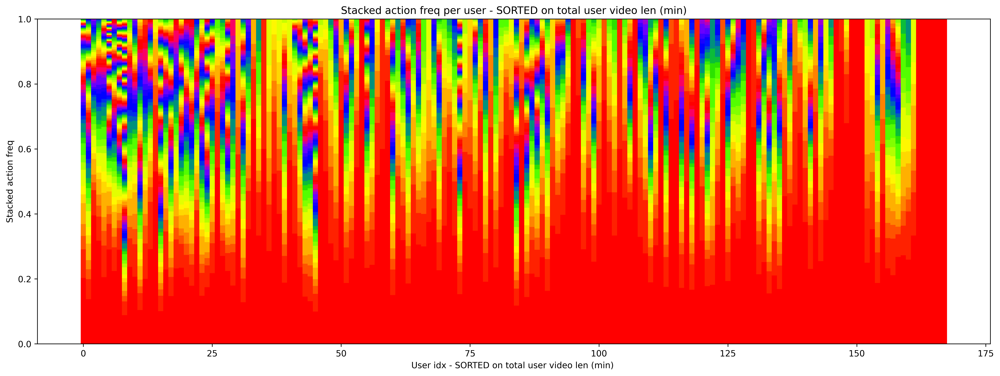

<Figure size 432x288 with 0 Axes>

In [13]:
# Other visualisation: users on x-axis and y-axis is multi-barplot where scenarios ordered on freq
import matplotlib.pyplot as plt
import numpy as np

def check_sum_one(list_of_distr):
    eps = 1e-5
    for distr in list_of_distr:
        prob_sum = sum(distr)
        assert 1-eps < prob_sum < 1 + eps, f"prob_sum={prob_sum} NOT SUMMING TO ONE"
        
df_sorted = user_action_freq_df.sort_values(by=['duration_sec_sum'],ascending=False)
video_lens_s = df_sorted['duration_sec_sum'].tolist()
# print(df_sorted)

# Stack bar plots: 
stack_user_counts_s = df_sorted['action_distr'].tolist()
check_sum_one(stack_user_counts_s)

# Transpose: List of 1st entries over users, list of 2nd entries, etc
stack_user_counts_st = np.asarray(stack_user_counts_s)
check_sum_one(stack_user_counts_st)
stack_user_counts_st = stack_user_counts_st.transpose()
print(stack_user_counts_st.shape)

plt.figure(figsize=(20, 7), dpi=600) # So all bars are visible!
x_axis = list(range(len(stack_user_counts_st[0])))

# my_cmap = plt.get_cmap("hsv")
my_cmap = plt.get_cmap("prism")
color_steps = np.linspace(0, 1, len(stack_user_counts_st))

# Config
bar_width = 1

# First bar
prev_bar_values = stack_user_counts_st[0]
plt.bar(x_axis, height=prev_bar_values, align='center', width=bar_width,color=my_cmap(color_steps[0]))
for idx, stack_user_count in enumerate(stack_user_counts_st[1:]):
    color = my_cmap(color_steps[idx+1])
    plt.bar(x_axis, height=stack_user_count, color=color,bottom=prev_bar_values, align='center', width=bar_width)
    
    assert len(prev_bar_values) == len(stack_user_count.tolist())
    prev_bar_values = [x+y for x,y in zip(prev_bar_values,stack_user_count.tolist())]


plt.ylim(None,None)
plt.xlim(None,None)
plt.xlabel("User idx - SORTED on total user video len (min) ")
plt.ylabel("Stacked action freq")
plt.title("Stacked action freq per user - SORTED on total user video len (min)")

# plt.grid(grid)
plt.show()
plt.clf()


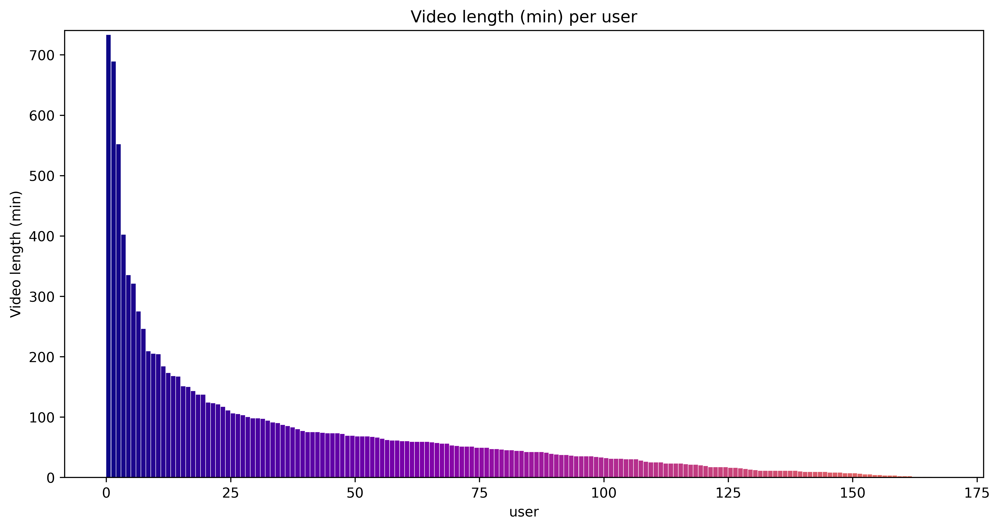

HEAD = [733, 689, 552, 402, 335, 321, 275, 246, 209, 205]...
TAIL = ...[3, 2, 2, 2, 1, 1, 1, 1, 0, 0]


<Figure size 432x288 with 0 Axes>

In [14]:
# Video lengths for this plot
# Barchart API: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.bar.html#matplotlib.pyplot.bar
def plot_barchart(x_axis, sorted_freq, title,ylabel,xlabel='User-ID', grid=False,yerror=None):
    max_val = max(sorted_freq)
    my_cmap = plt.get_cmap("plasma")
    plt.figure(figsize=(12, 6), dpi=600) # So all bars are visible!
    plt.bar(x_axis, height=sorted_freq,color=my_cmap.colors, align='edge',yerr=yerror,width=0.9)
    plt.ylim(None,max_val*1.01)
    plt.xlim(None,None)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(grid)
    plt.show()
    plt.clf()
    
    print(f"HEAD = {sorted_freq[:10]}...")
    print(f"TAIL = ...{sorted_freq[-10:]}")
y_axis = [int(x/60) for x in video_lens_s]
x_axis = [idx for idx in range(len(video_lens_s))]

# Counts
plot_barchart(x_axis, y_axis, title='Video length (min) per user',ylabel='Video length (min)',xlabel="user")


In [18]:
# CHECK CROSS-SPLITS: Are there mutually excl users in each split?
# Test has no labels
import pandas as pd
import numpy as np
from collections import Counter
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)       


annotation_file_dir = "/fb-agios-acai-efs/Ego4D/ego4d_data/v1/annotations"
annotation_file_names = {'train':"fho_lta_train.json",'val':'fho_lta_val.json','test':'fho_lta_test_unannotated.json'}
with open(osp.join(annotation_file_dir, annotation_file_names['train']), 'r') as train_file, \
    open(osp.join(annotation_file_dir, annotation_file_names['val']), 'r') as val_file:
    train_clips = json.load(train_file)['clips']
    val_clips = json.load(val_file)['clips']

train_clips_df = pd.json_normalize(train_clips)
val_clips_df = pd.json_normalize(val_clips)
print(f"trainshape={train_clips_df.shape}")
print(f"valshape={val_clips_df.shape}")


train_joined_df = pd.merge(video_df, train_clips_df, on="video_uid",validate="one_to_many",how="inner") # Inner-join (Intersection of  video-uid values)
val_joined_df = pd.merge(video_df, val_clips_df, on="video_uid",validate="one_to_many",how="inner") # Inner-join (Intersection of  video-uid values)
print(f"train_joined_df={train_joined_df.shape}")
print(f"val_joined_df={val_joined_df.shape}")


train_user_df = group_innerjoin_by_user(train_joined_df)
val_user_df = group_innerjoin_by_user(val_joined_df)
print(f"train_user_df={train_user_df.shape}")
print(f"val_user_df={val_user_df.shape}")

print("Overlap between the val/train users = {}".format(
sum((train_user_df.fb_participant_id.isin(val_user_df.fb_participant_id) == True))
))


trainshape=(23610, 20)
valshape=(15587, 20)
train_joined_df=(23610, 73)
val_joined_df=(15587, 73)
train_user_df=(168, 12)
val_user_df=(144, 12)
Overlap between the val/train users = 115


In [ ]:
# Let's merge train/val
trainval_clips_df = 